In [1]:
# 딥러닝
# 우리는 이미 모델을 다운로드 받아서 사용할 수 있다. 
# 대회에서 우승했던 모델들을 사용해서 분류기를 만들어보자. 
# 이미지 증식 관련 내용을 다뤄보자. 
# 사전학습된 모델을 이용해서 새로운 이미지를 인풋해보자.
import tensorflow as tf                              # 텐서플로 호출
from tensorflow.keras.preprocessing import image     # 케라스 이미지 호출
import numpy as np                                   # 넘파이 호출                               
import matplotlib.pyplot as plt                      # 파이플랏
from tensorflow.image import pad_to_bounding_box     # 이미지 묶기
from tensorflow.image import central_crop            # 가운데 추출
from tensorflow.image import resize                  # 이미지 크기조절

In [5]:
bgd = image.load_img('dogs.png')                     # 이미지 불러오기
# 강아지 사진이다. 

In [6]:
image.img_to_array(bgd)                              # 이미지 배열화
# 강아지사진은 분해되었다. 

array([[[248., 248., 248.],
        [248., 248., 248.],
        [248., 248., 248.],
        ...,
        [248., 248., 248.],
        [248., 248., 248.],
        [248., 248., 248.]],

       [[248., 248., 248.],
        [248., 248., 248.],
        [248., 248., 248.],
        ...,
        [248., 248., 248.],
        [248., 248., 248.],
        [248., 248., 248.]],

       [[248., 248., 248.],
        [248., 248., 248.],
        [248., 248., 248.],
        ...,
        [248., 248., 248.],
        [248., 248., 248.],
        [248., 248., 248.]],

       ...,

       [[248., 248., 248.],
        [248., 248., 248.],
        [248., 248., 248.],
        ...,
        [248., 248., 248.],
        [248., 248., 248.],
        [248., 248., 248.]],

       [[248., 248., 248.],
        [248., 248., 248.],
        [248., 248., 248.],
        ...,
        [248., 248., 248.],
        [248., 248., 248.],
        [248., 248., 248.]],

       [[248., 248., 248.],
        [248., 248., 248.],
        [248., 2

In [7]:
image.img_to_array(bgd).shape                   # 이미지 배열화,(높이, 너비, 채널)
# 이미지는 3차원 구조의 배열로 되어있는 상태이다. 

(1157, 1148, 3)

In [8]:
bgd_vector = np.asarray(image.img_to_array(bgd))# 이미지벡터에 전달하자. 
bgd_vector = bgd_vector/255                     # 정규화도 같이 해주자

In [9]:
# 정규화, 표준화는 데이터에 대한 단위가 다른 경우 데이터를 일정 범위 안으로 가지고 오는 것이다.
# 정규화는 데이터의 범위차이가 많이 있을때 공통의 척도 내부로 들어오게 만드는 것이다. 
# 표준화는 평균이 0, 표준편차가 1이 되도록 만드는 것이다. 
# 표준화를 하게 되면 학습속도가 빠르다. 그레디언트 디센트를 할때 속도가 빨라진다.
# 정규화와 표준화의 시기는 따로 정해져있지는 않다. 
# 몸무게 데이터, 키 데이터를 예로 들어보자. 
# 이 두 요소의 격차가 크면 이 것들을 0과 1 사이에 들어오게 하는 것이다.
# 데이터의 분포를 고려하지 않고 단순하게 0과 1사이로 놓는다면 정규화가 낫다.
# 정규화의 단점으로는 데이터가 평균으로부터 얼마나 떨어져있는지 가늠하기 어렵다.
# 예를 들면 몸무게가 30인 사람이 최소, 최대값이 70이고 몸무게 평균이 60일때를 기준으로 하자.
# 문제는 30인 사람은 정규화를 하면 수치가 0이 되버려서 어느정도 떨어져있는지 알 수 없다. 
# 정규화가 많이 쓰이는 경우는 상한이 정해져 있을때이다.
#
# 표준화는 평균을 기준으로 상대적으로 떨어진 위치를 표준편차 를 기준으로 표시하는 것이다. 
# 몸무게의 평균을 구한다음 어느정도 떨어져 있는지 보는 것이다. 
# 표준화는 특정 정규분포를 띄는 자료에서 많이 사용한다. 대체로 정규화보다 표준화가 많이 사용된다.
# 몸무게가 30인 사람이 최소, 최대값이 70이고 몸무게 평균이 60일때를 보자.
# 몸무게 30은 -4시그마. 몸무게 70은 2시그마로 표현 가능하다. 
# 정규화는 minmaxscaler, 표준화는 standardscaler이다. 

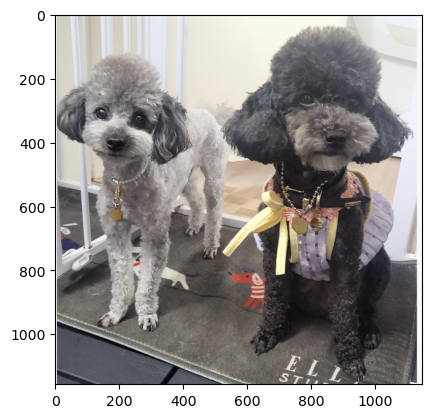

In [11]:
plt.imshow(bgd_vector)                          # 플랏에 이미지 이미지 보여주기
plt.show()                                      # 이미지 보여주기

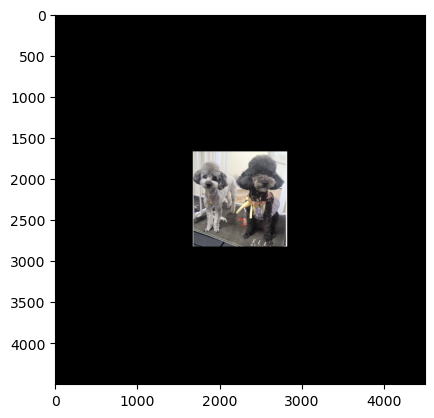

In [12]:
# 이미지 크기 변경하기 
#이미지의 변경할 크기 설정 
target_height = 4500
target_width = 4500
 
#현재 이미지의 크기 지정 
source_height = bgd_vector.shape[0]    # 소스 높이 1157
source_width = bgd_vector.shape[1]     # 소스 폭 1148
 
#padding 실시 : pad_to_bounding_box 사용 
bgd_vector_pad = pad_to_bounding_box(bgd_vector,                           # 패드를 박스로 묶기 
                                     int((target_height-source_height)/2), # 타겟높이-설정폭을 2로 나눠서 정수화
                                     int((target_width-source_width)/2),   # 타겟폭-설정폭을  2로 나눠 정수화
                                     target_height, 
                                     target_width)
                                     
 #이미지 형태 확인 
bgd_vector_pad.shape
 
#이미지 확인 
plt.imshow(bgd_vector_pad)
plt.show()

#이미지 저장 
image.save_img('dogs_pad.png', bgd_vector_pad)

In [13]:
 #이미지 형태 확인 
bgd_vector_pad.shape              # 이미지의 크기는 설정된 크기이다. 

TensorShape([4500, 4500, 3])

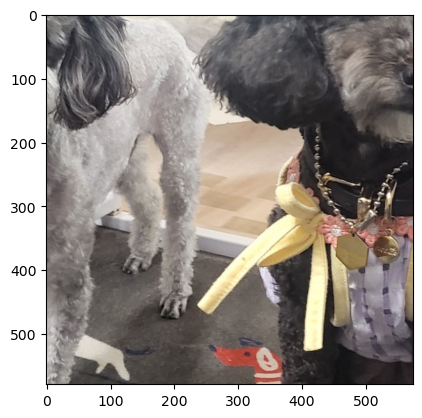

In [14]:
#가운데를 중심으로 50%만 crop 
bgd_vector_crop = central_crop(bgd_vector, .5)  # 가운데만 추출하기
 
bgd_vector_crop.shape
 
plt.imshow(bgd_vector_crop)
plt.show()

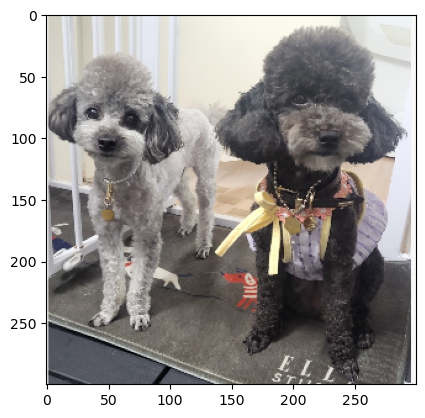

In [15]:
bgd_vector_resize = resize(bgd_vector, (300,300)) # 원본사진크기 설정하기 
 
bgd_vector_resize.shape
 
plt.imshow(bgd_vector_resize)

In [16]:
#사전학습 모델 불러오기 : 케라스에서 클래스 형태로 제공함 
from tensorflow.keras.applications.vgg16 import VGG16  # 사전학습된 모델 불러오기
 
#weight, include_top 파라미터 설정 
model = VGG16(weights='imagenet', include_top=True)    # 이걸 동일하게 사용하면 된다. 
model.summary()                                        # 논문으로 본 설계도가 그대로 학습되어져있다. 

553467096/553467096 [==============================] - 38s 0us/step
Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                           

In [ ]:
from tensorflow.keras.applications.inception_v3  import InceptionV3
# 탭을 누르자. 사전학습된 모델들이다. 역대 우승했던 학습된 모델이다. 


In [17]:
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.preprocessing import image
 
import matplotlib.pyplot as plt
from PIL import Image
from tensorflow.keras.applications.imagenet_utils import decode_predictions
from tensorflow.keras.applications.imagenet_utils import preprocess_input
import numpy as np
 
img = Image.open('dogs.png')

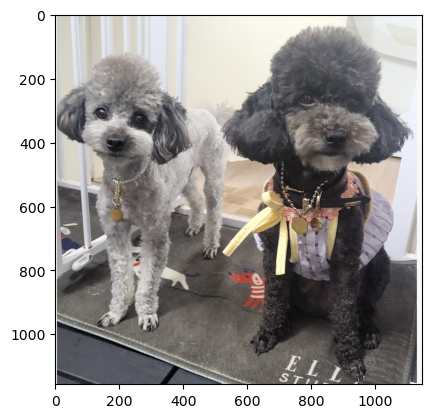

In [18]:
plt.imshow(np.asarray(img))                      # 이미지를 보자.

In [19]:
# 이미지 크기가 작은 값이 1148이고 큰값이 1157이다.
w, h = img.size # 이미지 사이즈를 두 개로 나눠서 바로 대입하자.
s = min(w, h)

In [20]:
y = (h - s) // 2
x = (w - s) // 2

In [23]:
print(w, h, x, y, s)

1148 1157 0 4 1148


In [24]:
img = img.crop((x, y, x+s, y+s))          # 이미지 크기를 변경할때 사용하는 함수이다. 
                                          # 보통은 resize를 쓴다. 높이, 너비, 좌측상단, 우측하단이다. 
                                          

In [25]:
img.size                                  # 이미지 크기가 맞춰졌다. 

(1148, 1148)

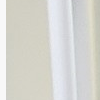

In [26]:
img.crop((0,0,100,100))
# 어느 좌표 기준으로 좌측상단, 우측하단을 찍어서 크기를 설정한다. 

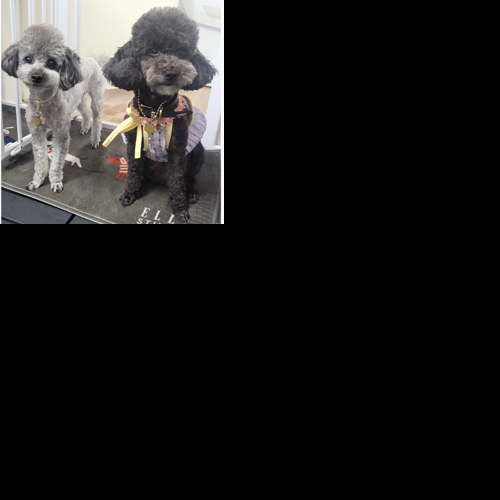

In [50]:
img.crop((0,0,500,500)) 
# 500곱하기 500으로 분류되었다.

In [28]:
# 물론 이미지의 크기가 너무 크다. 
model.layers[0].input_shape
# 모델은 224*224*3을 인풋받는다. 너무 크면 인풋 자체가 안된다. 

[(None, 224, 224, 3)]

In [30]:
target_size = 224
img = img.resize((target_size, target_size)) # 이미지를 다시 224*224로 바꾸겠다는 뜻이다.

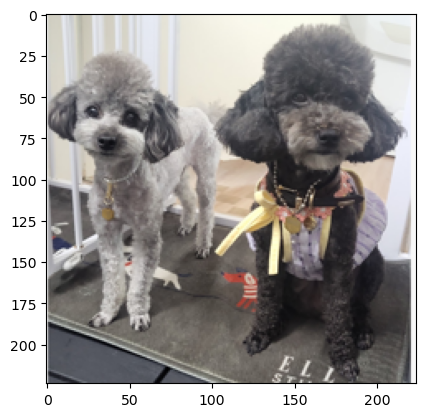

In [31]:
plt.imshow(np.asarray(img))                  # 이미지가 줄어들었다. 

In [32]:
np_img = image.img_to_array(img)
np_img.shape  #(224, 224, 3)

(224, 224, 3)

In [33]:
img_batch = np.expand_dims(np_img, axis=0) # 이걸 1장씩 학습한다. 
img_batch.shape

(1, 224, 224, 3)

In [34]:
pre_processed = preprocess_input(img_batch)

In [35]:
y_preds = model.predict(pre_processed)
 
y_preds.shape  # 종속변수가 취할 수 있는 값의 수 = 1000
 
np.set_printoptions(suppress=True, precision=10)
y_preds
 
#가장 확률이 높은 값
np.max(y_preds)

1/1 [==============================] - 0s 469ms/step


0.78416103

In [36]:
decode_predictions(y_preds, top=10)   # 결과값 확률이다. 소프트맥스가 적용이 되었다. 
                                      # 78% 확률로 토이푸들이라고 나온다. 
                                      # 클래스가 천개가량 있다. 
                                      # 소프트맥스가 적용되어서 top 1000을 다 합치면 1이 된다. 
                                      # 학습이 상당히 잘 되어있다. 

35363/35363 [==============================] - 0s 3us/step


[[('n02113624', 'toy_poodle', 0.78416103),
  ('n02113712', 'miniature_poodle', 0.16782114),
  ('n02096437', 'Dandie_Dinmont', 0.01923898),
  ('n02093647', 'Bedlington_terrier', 0.016176438),
  ('n02113799', 'standard_poodle', 0.012043098),
  ('n02097047', 'miniature_schnauzer', 8.5362444e-05),
  ('n02105641', 'Old_English_sheepdog', 8.354024e-05),
  ('n02086240', 'Shih-Tzu', 7.7943914e-05),
  ('n02085936', 'Maltese_dog', 1.9853807e-05),
  ('n02106382', 'Bouvier_des_Flandres', 1.9203428e-05)]]

In [37]:
np.sum(y_preds) # 확률은 전부 더하면 1이다. 

1.0000001

In [40]:
from tensorflow.keras.applications.vgg19 import VGG19   # 이거 한번 써보자. 
model = VGG19(weights='imagenet', include_top=True)     # 이걸 동일하게 사용하면 된다. 
model.summary()  

574710816/574710816 [==============================] - 35s 0us/step
Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                           

In [43]:
y_preds = model.predict(pre_processed)
 
y_preds.shape  # 종속변수가 취할 수 있는 값의 수 = 1000
 
np.set_printoptions(suppress=True, precision=10)
y_preds
 
#가장 확률이 높은 값
np.max(y_preds)

1/1 [==============================] - 0s 134ms/step


0.71639794

In [42]:
pre_processed = preprocess_input(img_batch)

In [44]:
decode_predictions(y_preds, top=10)            # 푸들로 그냥 확률이 높아졌다. 

[[('n02113624', 'toy_poodle', 0.71639794),
  ('n02113712', 'miniature_poodle', 0.26707768),
  ('n02113799', 'standard_poodle', 0.014284524),
  ('n02102318', 'cocker_spaniel', 0.0006883433),
  ('n02093647', 'Bedlington_terrier', 0.00046878526),
  ('n02085936', 'Maltese_dog', 0.00032906316),
  ('n02086240', 'Shih-Tzu', 0.00016179834),
  ('n03207941', 'dishwasher', 0.00011533536),
  ('n02096437', 'Dandie_Dinmont', 5.6460536e-05),
  ('n02105641', 'Old_English_sheepdog', 5.1492592e-05)]]

In [51]:
# 사실 resize를 써서 조절해도 된다. 다만 대한민국이라는 단어를 쓸때 작게 해서 resize를 쓰는게 낫다.
# 문제는 그림판에서 그리더라고 rgb 채널로 저장된다. 차원이*3이 되는 것이다.
# 손글씨를 쓰고 레블링을 해야한다. 
# 증식하는것까지 끝내보자. 
# 이미지 증식을 하는 이유는 이미지가 부족하기 때문이다.
# 부족한 이미지를 대체하기 위해서 이미지를 증식한다. 
# 영상처리쪽으로 공부하는 것은 아니다. 그래서 간략하게 시행할 것이다. 
image = Image.open('dogs.png').resize((500, 400))
# 이미지 증식은 부족한 이미지를 대체하기 위함이다.
# 이미지 증식은 비싸고 돈을 주고 사야 한다. 이미지 공급이 원할하지 않기 때문이다.
# 가장 최근에 나온 개념이다. 간으로 이어지고 메타러닝으로 이어진다. 

In [52]:
image_tensor = tf.keras.preprocessing.image.img_to_array(image)

In [53]:
image_tensor.shape 
# 글자쓰기 대회를 알 것이다. 
# 10장씩 작성할 것이고. 이미지로 저장할 것이다.
# 테스트 데이터로 쓸 글자 3장을 작성할 것이다. 
# 글자는 "대한민국"이라고 작성할 것이다.
# 번호부여는 0번부터 20번까지 부여될 것이다. 원핫 인코딩으로 답안이 제출될 것이다. 
# 오후에 진행할 것이다. 혼자하기 부담스러우면 짝을 이뤄서 하면 된다. 
# 이미지 증식을 한다면 성능비교도 해보면 좋겠다.
# 증식을 어떻게 했는지 다양한 방식으로 확인해야한다.
# 증식된 파일을 저장할 수 있어야 한다. 
# 1장당 회전/ 반전 등 다양한 작업을 통해 5장씩 증식했다고 할 때 
# 5*200이라서 1천장의 테스트가 이루어질 것이다. 
# 1천장을 cnn모델로 만들고 test를 진행하고 정확도를 볼 것이다. 
# 카페에 업로드를 하자. 
# 먼저 윈도우에 그림판에 들어가자. 
# 새로만들기를 눌러서

(400, 500, 3)

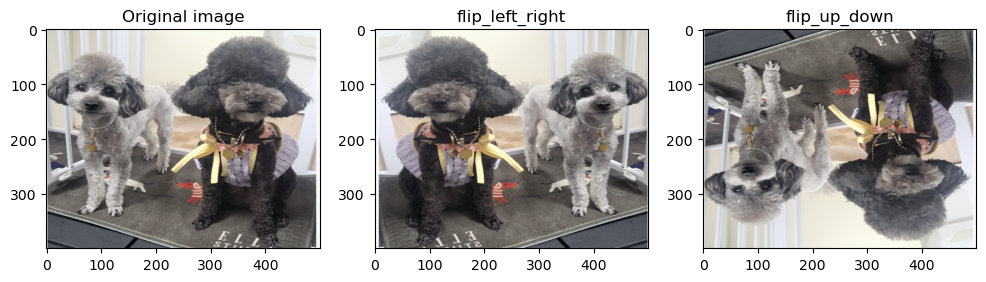

In [54]:
# 플립(flip) 기능
# 좌우*상하반전을 말한다. 
flip_lr_tensor = tf.image.flip_left_right(image_tensor)
flip_ud_tensor = tf.image.flip_up_down(image_tensor)
flip_lr_image = tf.keras.preprocessing.image.array_to_img(flip_lr_tensor)
flip_ud_image = tf.keras.preprocessing.image.array_to_img(flip_ud_tensor)


plt.figure(figsize=(12,12))

plt.subplot(1,3,1)
plt.title('Original image')
plt.imshow(image)

plt.subplot(1,3,2)
plt.title('flip_left_right')
plt.imshow(flip_lr_image)

plt.subplot(1,3,3)
plt.title('flip_up_down')
plt.imshow(flip_ud_image)

plt.show()

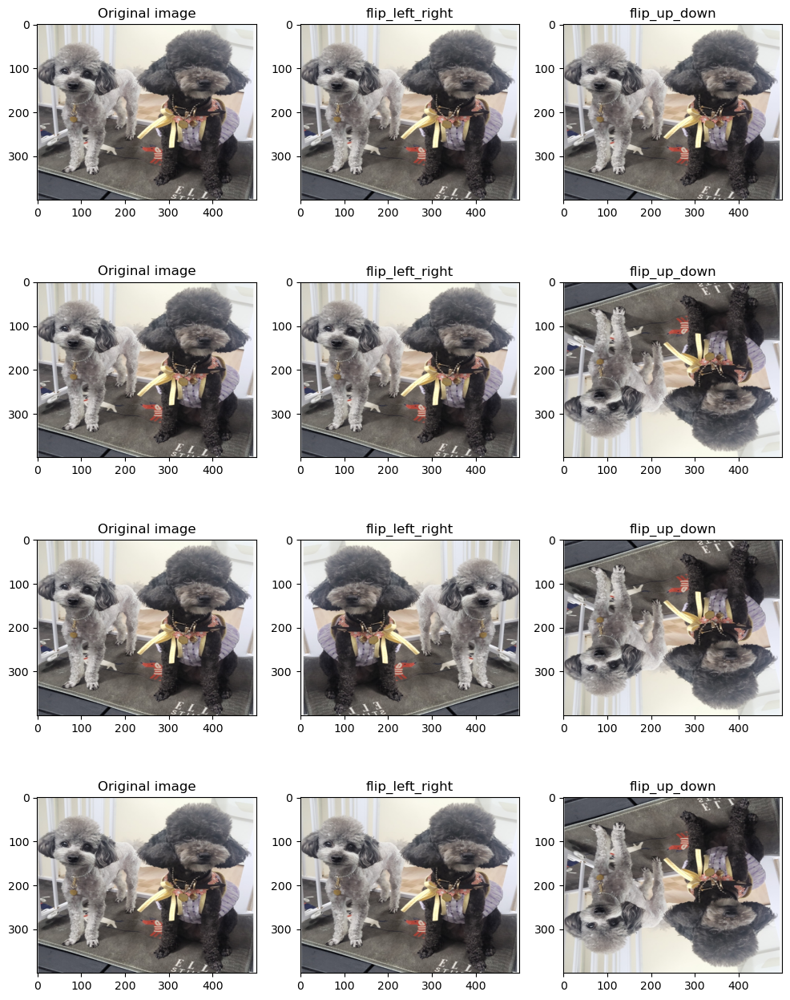

In [55]:
# 영상을 전문으로 처리하는 사람들을 영상처리 전문가라고 한다. 
# 이미지가 다른 방식으로 증식된거 같다. 
# 랜덤플립은 아무렇게나 반전하고 뒤집는다는 뜻이다. 각도도 다르도 방향도 다르다. 
plt.figure(figsize=(12,16))

row = 4
for i in range(row):
  flip_lr_tensor = tf.image.random_flip_left_right(image_tensor)
  flip_ud_tensor = tf.image.random_flip_up_down(image_tensor)
  flip_lr_image = tf.keras.preprocessing.image.array_to_img(flip_lr_tensor)
  flip_ud_image = tf.keras.preprocessing.image.array_to_img(flip_ud_tensor)

  plt.subplot(4,3, i*3+1)
  plt.title('Original image')
  plt.imshow(image)

  plt.subplot(4,3,i*3+2)
  plt.title('flip_left_right')
  plt.imshow(flip_lr_image)

  plt.subplot(4,3,i*3+3)
  plt.title('flip_up_down')
  plt.imshow(flip_ud_image)
# 꽤 다양하고 랜덤하게 바뀌었다. 확률에 따라서 적용할 수 있도록 하려면 붙여서 할 수도 있다. 

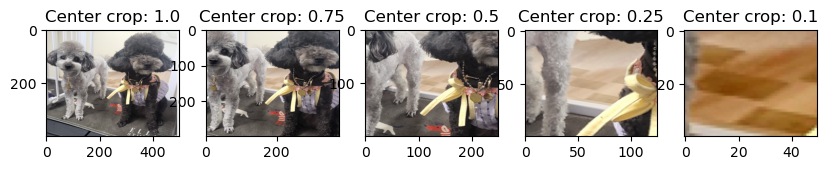

In [56]:
plt.figure(figsize=(12,15))

central_fractions = [1.0, 0.75, 0.5, 0.25, 0.1]     # 확대하는 비율을 나타낸다. 
col = len(central_fractions)                        # 
for i, frac in enumerate(central_fractions):
  cropped_tensor = tf.image.central_crop(image_tensor, frac)
  cropped_img = tf.keras.preprocessing.image.array_to_img(cropped_tensor)

  plt.subplot(1, col+1, i+1)
  plt.title(f'Center crop: {frac}')
  plt.imshow(cropped_img)
# 특정 비율로 그림을 잘라버리는 것이다. 
# 이미지를 중심으로 자르는 것처럼 보인다. 
# 문제는 원본 이미지가 잘려나간다. 저 바닥을 푸들로 인식하면 안되지 않는가.
# 바다, 눈밭을 찍는게 아닌이상 거의 쓰지 않을 기능이다. 

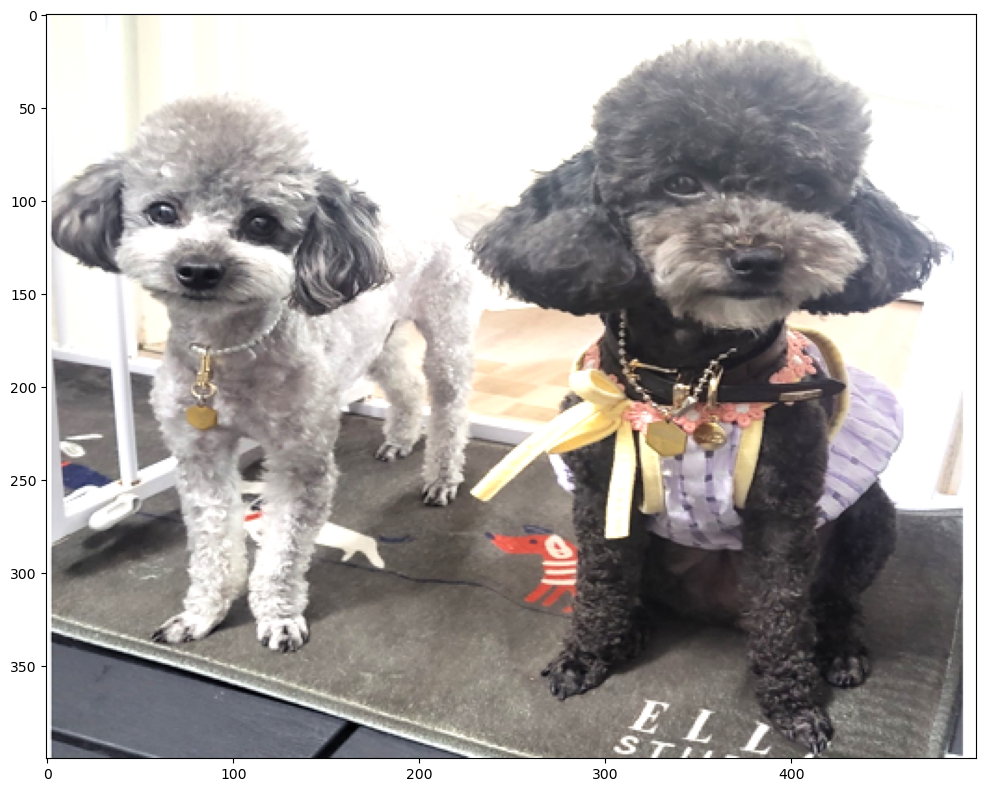

In [57]:
# 밝기조절기능
plt.figure(figsize=(12, 15))

random_bright_tensor = tf.image.random_brightness(image_tensor, max_delta=128)     
random_bright_tensor = tf.clip_by_value(random_bright_tensor, 0, 255)
random_bright_image = tf.keras.preprocessing.image.array_to_img(random_bright_tensor)

plt.imshow(random_bright_image)
plt.show()

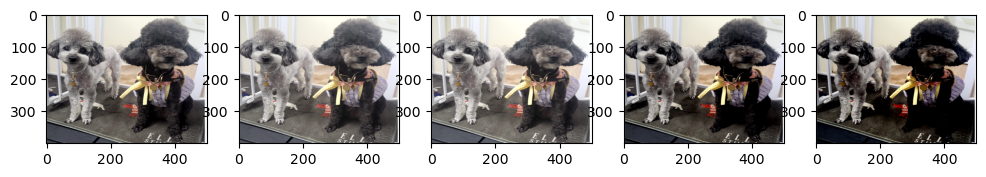

In [60]:
plt.figure(figsize=(12,15))

for i in range(5):
  random_bright_tensor = tf.image.random_brightness(image_tensor, max_delta=128) # 만약 맥스델타가 작으면 밝을 것이다. 
  random_bright_tensor = tf.clip_by_value(random_bright_tensor, 0, 255)
  random_bright_image = tf.keras.preprocessing.image.array_to_img(random_bright_tensor)

  plt.subplot(1, 5, i+1)
  plt.imshow(random_bright_image)
# https://www.tensorflow.org/api_docs/python/tf/image/random_brightness
# 밝기조절관련 설명서이다. 직접 값을 줄 수도 있지만 랜덤하게 주는 것도 가능하다.
# 물론 밝기를 조절하는 것만으로는 원하는 결론을 도출하기는 어려울 수는 있다.
# 이미지의 밝기에 따라 괜찮은 성능을 낼 수 있다면 고려할 만 하다. 

In [61]:
pip install albumentations    #앨범엔테이션은 회전에 필요한 모듈을 제공한다.

   ---------------------------------------- 0.0/125.7 kB ? eta -:--:--
   ---------------------------------------  122.9/125.7 kB ? eta -:--:--
   ---------------------------------------- 125.7/125.7 kB 1.5 MB/s eta 0:00:00
   ---------------------------------------- 0.0/38.0 MB ? eta -:--:--
    --------------------------------------- 0.7/38.0 MB 14.0 MB/s eta 0:00:03
   - -------------------------------------- 1.6/38.0 MB 17.5 MB/s eta 0:00:03
   --- ------------------------------------ 3.1/38.0 MB 19.6 MB/s eta 0:00:02
   ---- ----------------------------------- 4.2/38.0 MB 22.7 MB/s eta 0:00:02
   ----- ---------------------------------- 5.5/38.0 MB 23.6 MB/s eta 0:00:02
   ------- -------------------------------- 6.9/38.0 MB 26.1 MB/s eta 0:00:02
   -------- ------------------------------- 8.2/38.0 MB 26.1 MB/s eta 0:00:02
   ---------- ----------------------------- 9.8/38.0 MB 28.5 MB/s eta 0:00:01
   ------------ --------------------------- 11.8/38.0 MB 34.4 MB/s eta 0:00:01
   

In [66]:
import numpy as np
image = Image.open('dogs.png').resize((400, 300)) # 이미지를 먼저 불러오자. 
image_arr = np.array(image)
image_arr.shape

(300, 400, 3)

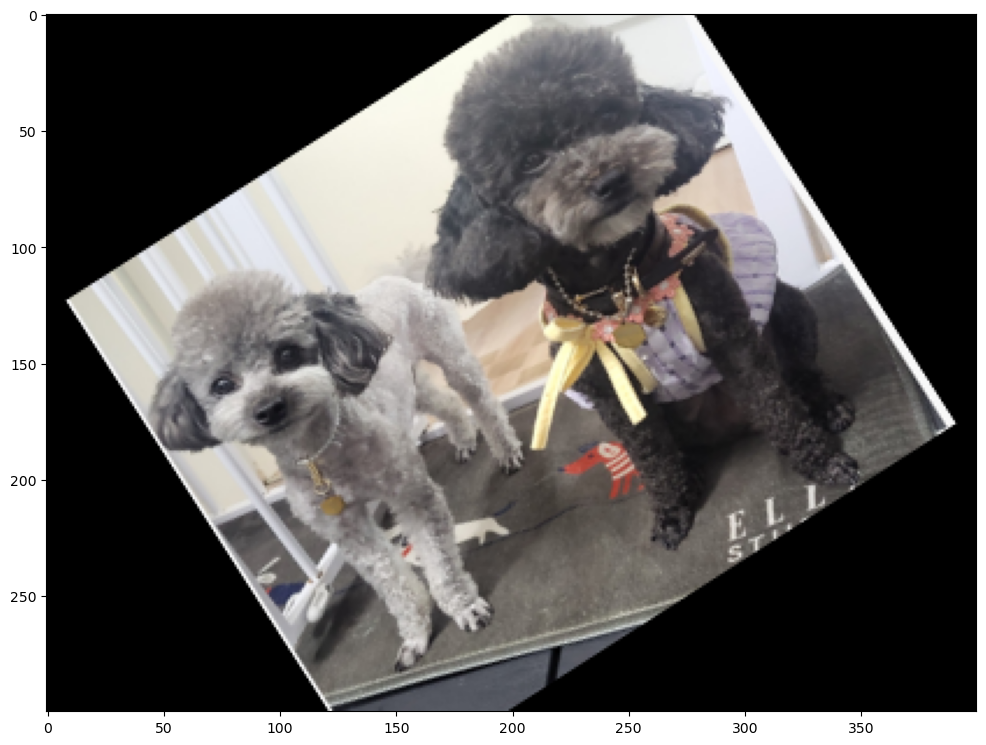

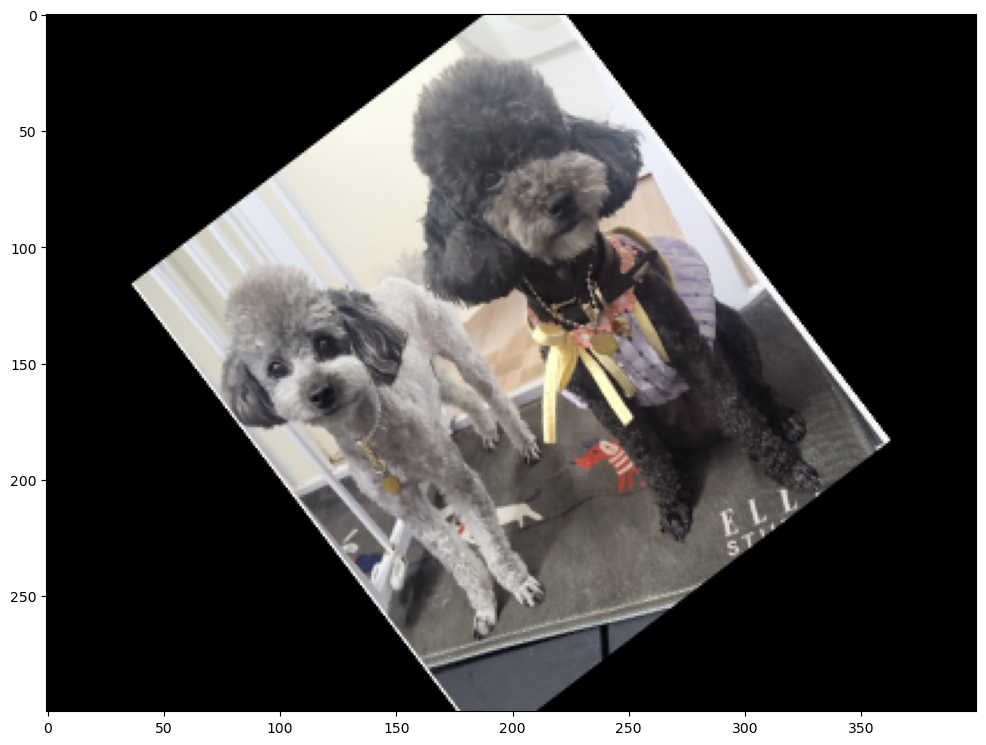

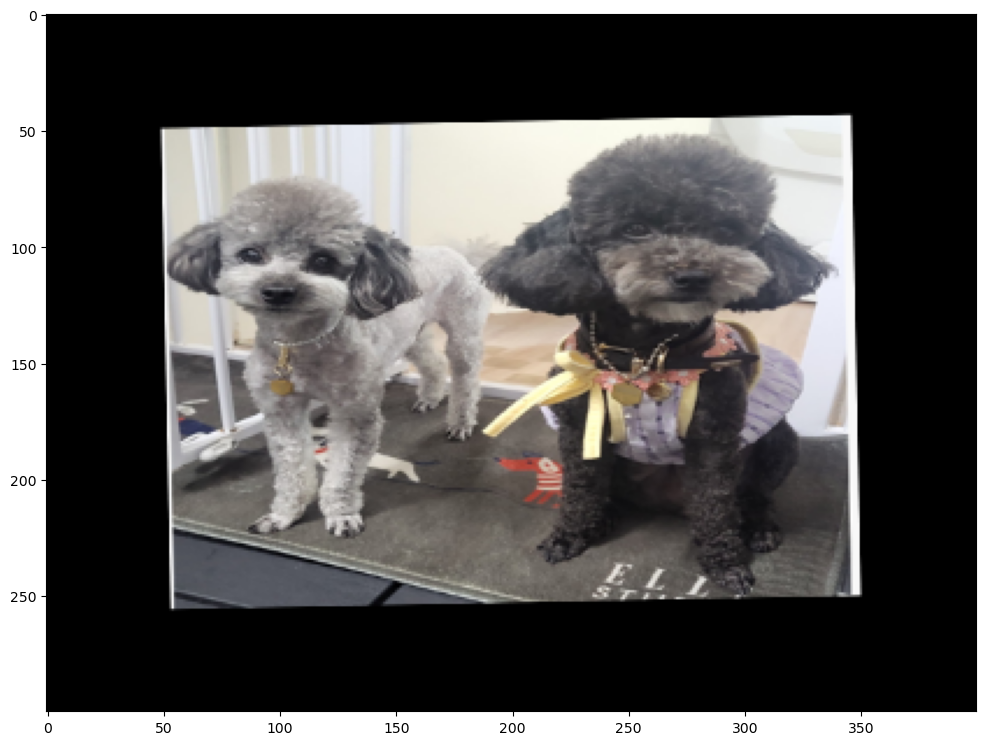

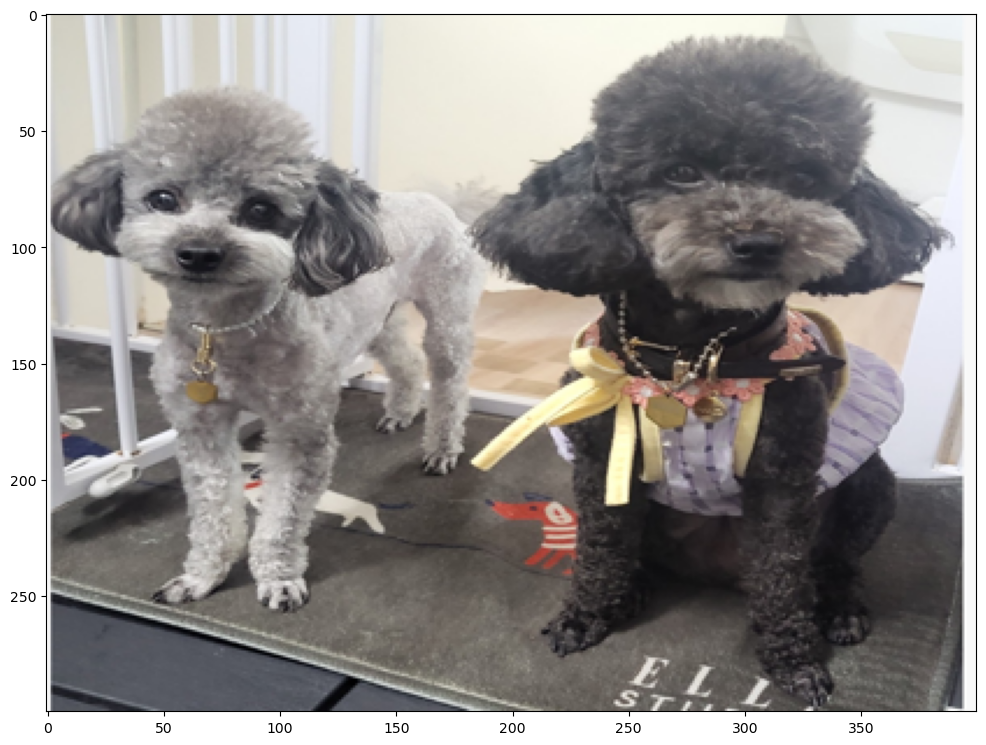

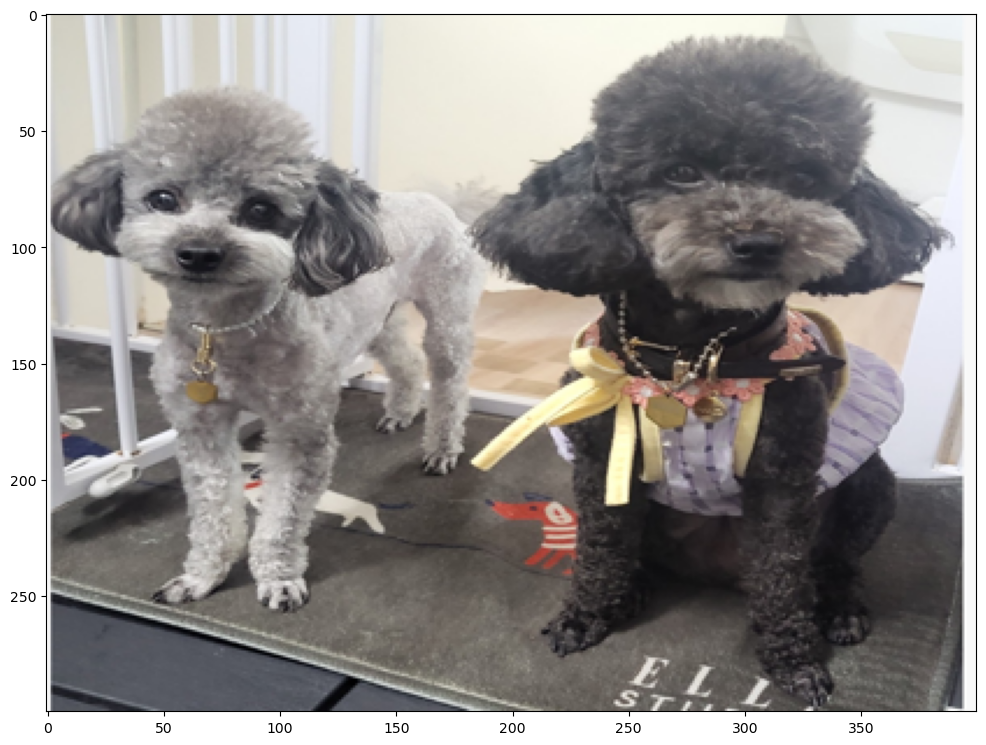

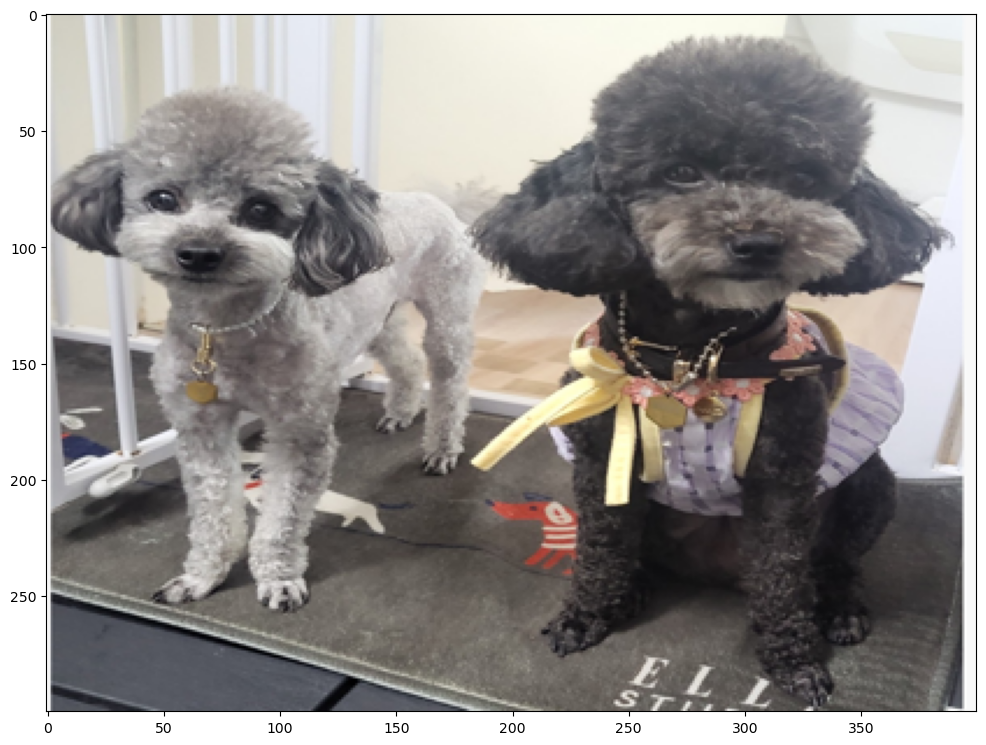

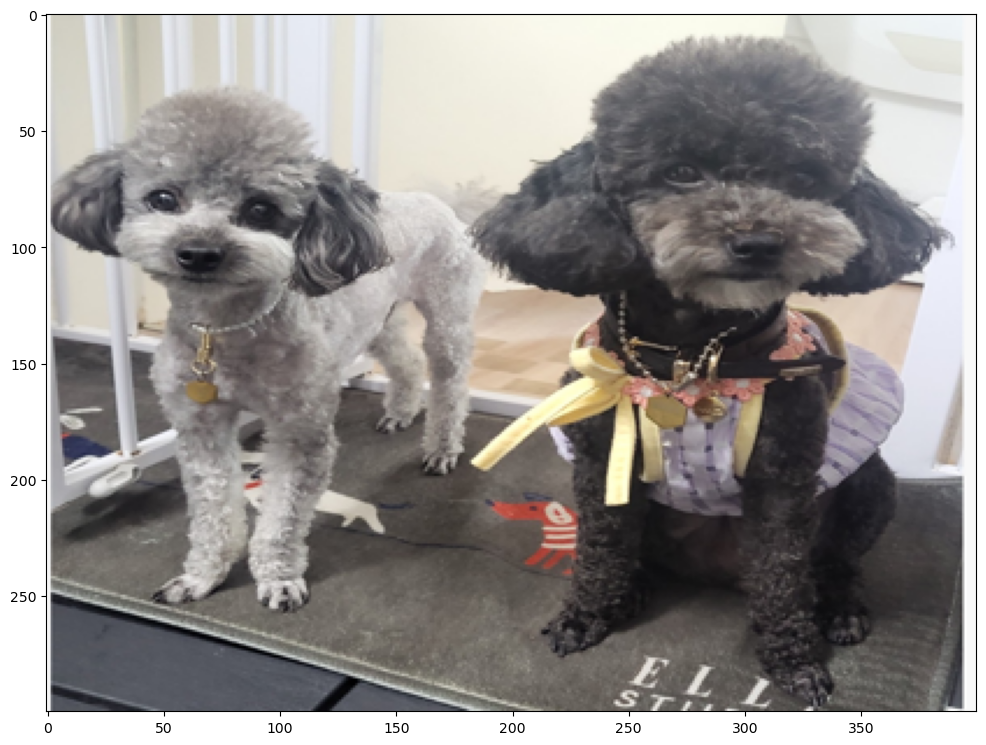

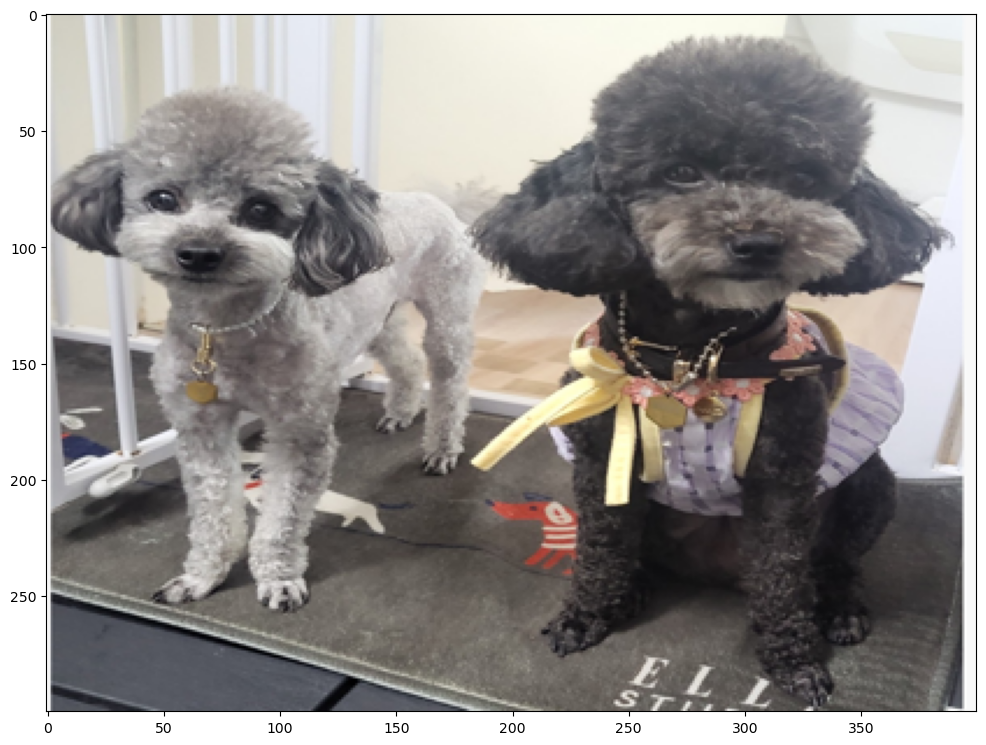

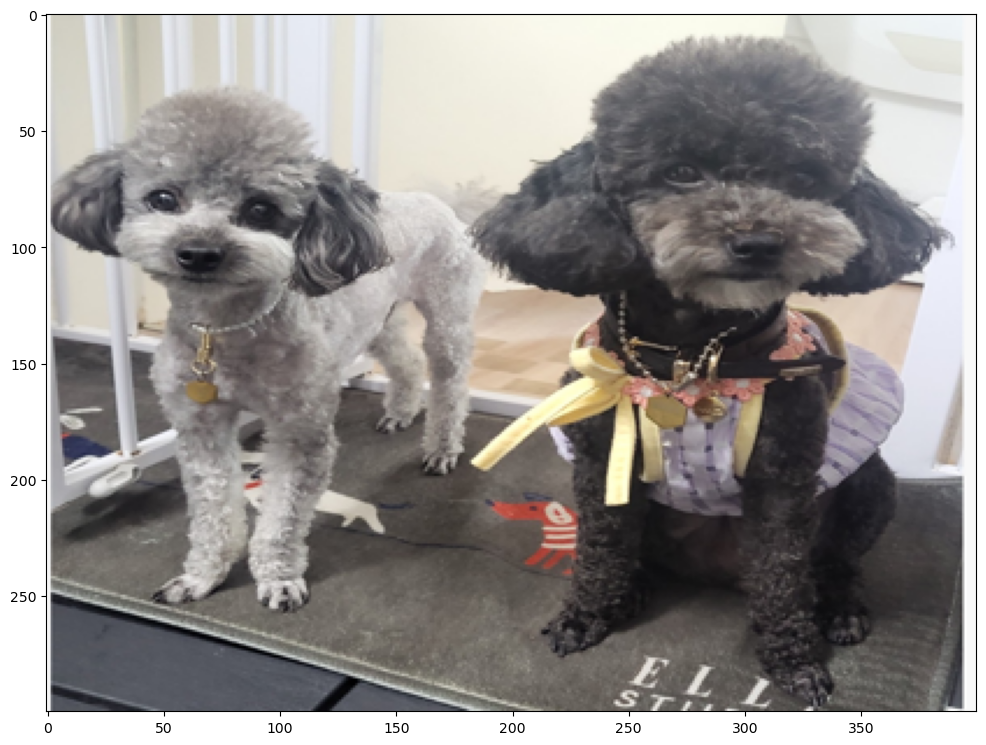

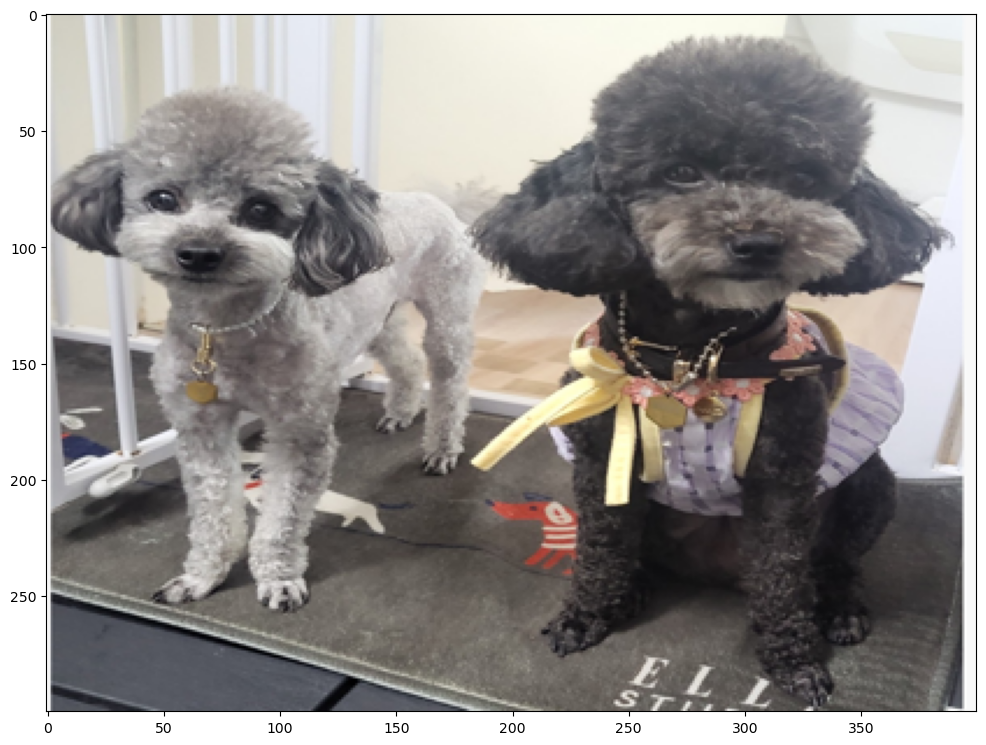

In [67]:
import albumentations as A

for i in range(10):
    transform = A.Compose([
      A.Affine(rotate=(-45,45), scale=(0.5,0.9), p=0.5)
    ])
    transformed = transform(image=image_arr)
    plt.figure(figsize=(12,12))
    plt.imshow((transformed['image']))
    plt.show()
    # 회전이 되었다. 
    # https://albumentations.ai/ 여기서 설명을 볼 수 있다. 
    # 사실 엘부먼테이션스만 잘 다뤄도 웬만한 이미지 증식은 다 가능하다. 
    # 심지어 욜로 기능도 전부 가능하다. 
    # 증식된 이미지를 저장할 수 있을 것이다. 

In [68]:
image_arr

array([[[248, 248, 248],
        [247, 247, 246],
        [212, 210, 199],
        ...,
        [248, 248, 248],
        [248, 248, 248],
        [248, 248, 248]],

       [[248, 248, 248],
        [247, 247, 246],
        [212, 211, 199],
        ...,
        [248, 248, 248],
        [248, 248, 248],
        [248, 248, 248]],

       [[248, 248, 248],
        [247, 247, 246],
        [213, 211, 200],
        ...,
        [248, 248, 248],
        [248, 248, 248],
        [248, 248, 248]],

       ...,

       [[249, 249, 249],
        [243, 243, 244],
        [104, 106, 114],
        ...,
        [248, 248, 248],
        [248, 248, 248],
        [248, 248, 248]],

       [[249, 249, 249],
        [243, 243, 244],
        [102, 105, 112],
        ...,
        [248, 248, 248],
        [248, 248, 248],
        [248, 248, 248]],

       [[249, 249, 249],
        [243, 243, 244],
        [103, 106, 114],
        ...,
        [248, 248, 248],
        [248, 248, 248],
        [248, 248, 248]]